 # Advanced Machine Learning - programming assignment 2

*Due: Sunday December 19*

**Please fill in:**
* Simon van de Fliert (5708656)
* Dirk Keller (4282264)

### Further instructions:
* Make sure your code is properly commented.
* You can find the required python packages in requirements.txt (Keep in mind, the grader most likely won't install additional packages. Try to stick with the standard library and the packages listed.)
* Submit your code in Blackboard using one of your accounts; we will put the grade in Blackboard for the other team member as well.
* **Make sure to name the submitted file according to your and your collaborators last name.** (submitter_collaborator.ipynb)

 ## Reinforcement learning with function approximation

In this assignment, you'll design your own agent to complete an episodic MDP task following the gym framework. The agent will be looking at a small part of the UU logo, and have to decide which of the four compass directions (i.e. left, right, up, down) to move in. The learning task is to find the goal in the center as soon as possible.

The learning objectives of this assignment are:

- Implement two versions of the agent using Semi-gradient SARSA and Q-learning algorithms with a linear approximation function,
- Demonstrate the difference between on-policy and off-policy RL methods,
- Learn to integrate the approximation function with Tabular RL methods,
- Play with the parameters discounted factor $\gamma$ and stepsize $\alpha$ and understand their influence on the learning procedure. 


### 1. Let's start with setting up the enviroment.

The following code defines various aspects of the environment.

In [3]:
#conda create -n assignment_env --file requirements.txt

In [1]:
import itertools as it
from abc import ABC, abstractmethod
from enum import IntEnum
from typing import List, Tuple

import gym
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statistics
import pickle
from gym import spaces
from IPython import display
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from matplotlib.backends.backend_agg import FigureCanvasAgg
from matplotlib.figure import Figure
from scipy import stats
from tqdm.notebook import tqdm  # For progress bars

In [2]:
# %matplotlib inline
# Constants defining the environment
GOAL = (140, 120)
CENTER = (132, 132)
AVG_MOVEMENT_SIZE = 24
ACCEPTABLE_DISTANCE_TO_GOAL = (AVG_MOVEMENT_SIZE // 2) + 1
RADIUS = 72
WINDOW_SIZE = 28
TIME_LIMIT = 200
TIMEOUT_REWARD = -100.0
MOVE_REWARD = -1
INVALID_MOVE_REWARD = -5


# This is for type inference
State = Tuple[int, int]



# Action space
class Actions(IntEnum):
    NORTH = 0
    EAST = 1
    SOUTH = 2
    WEST = 3


# Boundaries
class Boundary(IntEnum):
    WEST = CENTER[0] - RADIUS #60
    EAST = CENTER[0] + RADIUS #204
    NORTH = CENTER[1] - RADIUS #60
    SOUTH = CENTER[1] + RADIUS # 204


class MovementArea(IntEnum):
    WEST = Boundary.WEST - (WINDOW_SIZE // 2)
    EAST = Boundary.EAST + (WINDOW_SIZE // 2)
    NORTH = Boundary.NORTH - (WINDOW_SIZE // 2)
    SOUTH = Boundary.SOUTH + (WINDOW_SIZE // 2)


# Image
ORIGINAL_IMAGE = plt.imread("UU_LOGO.png")
# Convert to one color channel (using only the red channel), with white background
IMAGE = ORIGINAL_IMAGE[:, :, 0] * ORIGINAL_IMAGE[:, :, 3] + (1.0 - ORIGINAL_IMAGE[:, :, 3])


# Get a "camera view" at the position indicated by state
# Use reshape=True to format the output as a data point for the neural network
def get_window(state: State, reshape=False) -> np.ndarray:
    # When indexing the image as an array, switch the coordinates: im[state[1], state[0]]
    window = IMAGE[(state[1] - 14):(state[1] + 14), (state[0] - 14):(state[0] + 14)]
    if reshape:
        return np.reshape(window, (1, 28, 28, 1))
    return window


# Is the state close enough to the goal to be considered a success?
# There is a margin for error, so that the agent can't jump over the goal
def is_goal_reached(state: State) -> bool:
    if np.amax(np.abs(np.asarray(state) - np.asarray(GOAL))) <= AVG_MOVEMENT_SIZE / 2 + 1:
        return True
    return False


# This is a helper function to render a run
def updatefig(j, images, imgplot, text_act_plot, text_reward_plot):
    # set the data in the axesimage object
    img, time_point, from_state, to_state, act, current_reward = images[min(len(images), j)]
    imgplot.set_data(img)
    text_act_plot.set_text(f"Time step: {time_point} - Action: {act}\nState: {from_state} -> {to_state}")
    text_reward_plot.set_text(f"Current total reward: {current_reward}")
    # return the artists set
    return [imgplot, text_act_plot]


# This will render a run of a full epoch
# The function needs a list of tuples containing an image array, a State, the performed action
def render_epoch(animation_data: List[Tuple[np.ndarray, State, Actions]], interval=100, blit=True, **kwargs):
    if not len(animation_data):
        return f"No images in the list"
    fig, ax = plt.subplots()
    imgplot = ax.imshow(np.zeros_like(animation_data[0][0]))
    text_act_plot = ax.set_title("", color="red", fontweight="extra bold", loc="left")
    text_reward_plot = ax.text(5, 255, "", color="red", fontweight="extra bold")
    params = [animation_data, imgplot, text_act_plot, text_reward_plot]
    ani = FuncAnimation(fig,
                        updatefig,
                        fargs=params,
                        frames=len(animation_data),
                        interval=interval,
                        blit=blit,
                        **kwargs)
    animation = HTML(ani.to_jshtml())
    plt.close()
    return display.display(animation)
    

 The following 2 images show:
 * The original image, with a red dot marking the goal and a red rectangle marking the area where the center of agent must remain. A movement that would take the agent outside this rectangle, places him at the boundary instead. The blue rectangle represents the area the agent is able to see, which is slightly bigger than the area in which it can move.
 * What the agent sees if s/he is exactly at the goal.

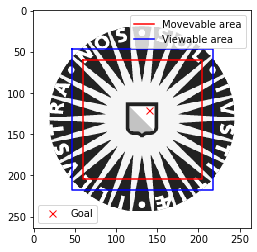

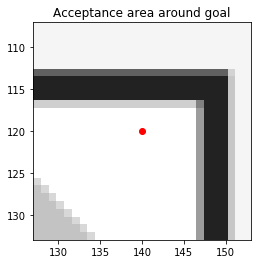

In [3]:
plt.imshow(IMAGE[:, :], cmap='gray', vmin=0, vmax=1.0)
# Plotting uses reversed y-axis now: larger y values are further down
goal_container = plt.plot(GOAL[0], GOAL[1], 'rx', markersize="7")
legend2 = plt.legend(goal_container, ["Goal"], loc=3)

plt.plot([Boundary.WEST, Boundary.WEST, Boundary.EAST, Boundary.EAST, Boundary.WEST],
         [Boundary.NORTH, Boundary.SOUTH, Boundary.SOUTH, Boundary.NORTH, Boundary.NORTH],
         'r-',
         label="Movevable area")
plt.plot([MovementArea.WEST, MovementArea.WEST, MovementArea.EAST, MovementArea.EAST, MovementArea.WEST],
         [MovementArea.NORTH, MovementArea.SOUTH, MovementArea.SOUTH, MovementArea.NORTH, MovementArea.NORTH],
         'b-',
         label="Viewable area")

plt.legend()
plt.gca().add_artist(legend2)
plt.show()

# window around goal
img_container = plt.imshow(get_window(GOAL),
                           cmap='gray',
                           vmin=0,
                           vmax=1.0,
                           extent=(GOAL[0] - ACCEPTABLE_DISTANCE_TO_GOAL, GOAL[0] + ACCEPTABLE_DISTANCE_TO_GOAL,
                                   GOAL[1] + ACCEPTABLE_DISTANCE_TO_GOAL, GOAL[1] - ACCEPTABLE_DISTANCE_TO_GOAL))
plt.plot(GOAL[0], GOAL[1], 'ro', linewidth=1)
plt.title("Acceptance area around goal")
plt.show()

 The following functions complete the definition of the environment. The agent's movements always go in the intended direction, but the distance travelled has a small random component. Besides by reaching the goal, the episode also terminates after TIME_LIMIT (200) steps; at that point, the agent gets a negative reward TIMEOUT_REWARD.

In [4]:
class Environment(gym.Env):
    metadata = {'render.modes': ['human', 'rgba_array']}
    bx = np.array([MovementArea.WEST, MovementArea.WEST, MovementArea.EAST, MovementArea.EAST, MovementArea.WEST])
    by = np.array([MovementArea.NORTH, MovementArea.SOUTH, MovementArea.SOUTH, MovementArea.NORTH, MovementArea.NORTH])

    def __init__(self):
        self.num_actions = Actions
        self.action_space = spaces.Discrete(len(self.num_actions))
        self.observation_space = spaces.Discrete(1)
        self.display = None
        self.img, self.img_container = Environment._init_visual_area(IMAGE)
        self.time = 0

    def seed(self, seed=None) -> int:
        np.random.seed(seed)
        return seed

    def step(self, action: Actions):
        assert self.action_space.contains(action)
        (x, y), was_invalid = self._validate_state(self._move(self.state, action))

        self.state = (x, y)
        reward = MOVE_REWARD if not was_invalid else INVALID_MOVE_REWARD
        reward = TIMEOUT_REWARD if self.time >= TIME_LIMIT else reward
        reward = self.time * reward
        done = is_goal_reached(self.state) or self.time >= TIME_LIMIT
        self.time += 1
        return self.state, reward, done, {}

    def reset(self, state: State = None) -> State:
        self.state = self.starting_state() if not state else state
        self.time = 0
        return self.state

    # returns the current environment situation
    def render(self, mode='rgba_array'):
        curr_img = np.array(self.img_container.get_array())
        x, y = self.state
        scaler = 4
        w, e, n, s = x - scaler, x + scaler, y - scaler, y + scaler
        curr_img[n:s, w:e, 0] = 255
        curr_img[n:s, w:e, 1] = 0
        curr_img[n:s, w:e, 2] = 255
        curr_img[n:s, w:e, 3] = 255
        cropped_img = curr_img  # Just for debugging purposes
        if mode == 'rgba_array':
            plt.close()
            return cropped_img  # return RGB frame suitable for video
        if mode == 'human':
            container = plt.imshow(curr_img)
            ax = container.axes
            ax.set_xlim(Boundary.WEST, Boundary.EAST, auto=None)
            ax.set_ylim(Boundary.SOUTH, Boundary.NORTH, auto=None)
            return container
        else:
            raise Exception(f"Please specify either 'rgba_array' or 'human' as mode parameter!")

    # Return a randomly chosen non-terminal state as starting state
    def starting_state(self) -> State:
        while True:
            state = (
                np.random.randint(Boundary.WEST, Boundary.EAST + 1),
                np.random.randint(Boundary.NORTH, Boundary.SOUTH + 1),
            )
            if not is_goal_reached(state):
                return state

    @staticmethod
    def _move(state: State, action: Actions) -> State:
        x, y = state
        if action == Actions.NORTH:
            y -= AVG_MOVEMENT_SIZE + np.random.randint(5) - 2
        elif action == Actions.SOUTH:
            y += AVG_MOVEMENT_SIZE + np.random.randint(5) - 2
        elif action == Actions.WEST:
            x -= AVG_MOVEMENT_SIZE + np.random.randint(5) - 2
        elif action == Actions.EAST:
            x += AVG_MOVEMENT_SIZE + np.random.randint(5) - 2
        return x, y

    @staticmethod
    def _validate_state(state: State) -> Tuple[State, bool]:
        x, y = state
        is_invalid = False
        if y < Boundary.NORTH:
            is_invalid = True
            y = int(Boundary.NORTH)
        if y > Boundary.SOUTH:
            is_invalid = True
            y = int(Boundary.SOUTH)
        if x < Boundary.WEST:
            is_invalid = True
            x = int(Boundary.WEST)
        if x > Boundary.EAST:
            is_invalid = True
            x = int(Boundary.EAST)
        return (x, y), is_invalid

    @staticmethod
    def _init_visual_area(img) -> np.ndarray:
        x, y = img.shape
        my_dpi = 80
        fig = Figure(figsize=(y / my_dpi, x / my_dpi), dpi=my_dpi)
        canvas = FigureCanvasAgg(fig)
        ax = fig.gca()

        ax.plot(GOAL[0], GOAL[1], 'ro', linewidth=5)
        ax.plot(Environment.bx, Environment.by, 'b-')
        img_container = ax.imshow(img[:, :], cmap='gray', vmin=0, vmax=1.0)
        ax.axis('off')
        fig.tight_layout()
        canvas.draw()  # draw the canvas, cache the renderer
        s, (width, height) = canvas.print_to_buffer()
        image = np.frombuffer(s, np.uint8).reshape((height, width, 4))
        img_container.set_data(image)
        plt.close()
        return image, img_container



### 2. Implement your agent

Next comes your part. The following class is responsible for the agent's behavior. The select_action function should implement the epsilon-greedy policy, and return an action chosen according to that policy. **Please fill in the missing codes in select_action function (1.5 points).** 

 Remark: This is an abstract class.
 Hence, its sole purpose is creating subclasses from it, which is also the reason it cannot be instantiated.
 The following subsequent subclasses will provide a specific implementation for the methods that are missing here.
 Therefore, you can ignore the functions that are not implemented. This is just a common way to make sure that all subclasses behave similarly.

In [5]:
class Agent(ABC):
    def __init__(self, alpha: float, gamma: float, epsilon: float):
        # set up the value of epsilon
        self.alpha = alpha  # learning rate or step size
        self.gamma = gamma  # discount rate
        self.epsilon = epsilon  # exploration rate
        self.hist = []
        self.w = []

    # Choose action at state based on epsilon-greedy policy and valueFunction
    def select_action(self, state: Tuple[int, int], is_greedy: bool = True) -> int:

        #### ANSWER ####
        
        # If random chosen value is smaller than epsilon AND the policy is not full greed, then randomly choose next action based on exploration
        if np.random.uniform(0,1) < epsilon and not is_greedy:
        
        #give all possible actions, later a random choice is made between these actions
            best_actions = [0,1,2,3]  #[action for i, action in enumerate(Actions)]
            
        # if either policy is full greed, or the random chosen value is higher than the epsilon value, choose the action with the best estimated reward --> based on exploitation
        else:
            #This is similar to state_value, but state_value will only return one maximum, and there might be multiple actions with the same estimated value. Splitting it as below allows this edge case to be checked.
            all_values = self.values(state)
            best_value = max(all_values)

            # get index (thus the action) corresponding with the best value
            best_actions = [index for index, value in enumerate(all_values) if value == best_value]
        
        chosen_best_action = int(np.random.choice(best_actions))
        #save values for history
        self.hist.append(self.value(state, chosen_best_action)) 
        
        #return best_actions
        return chosen_best_action

    # Return estimated action value of given state and action
    @abstractmethod
    def value(self, state: State, action: Actions) -> float:
        pass

    # Return vector of estimated action values of given state, for each action
    @abstractmethod
    def values(self, state: State) -> np.ndarray:
        pass

    # learn with given state, action and target
    @abstractmethod
    def learn(self, state: State, action: Actions, next_state: State, reward: float, done: bool = False):
        pass

    # get the final Q-value look up table
    @abstractmethod
    def get_w(self, state: State) -> np.ndarray:
        pass

    # Return estimated state value, based on the estimated action values
    def state_value(self, state):
        return np.max(self.values(state))

    # Plot the state value estimates. Use a larger stride for lower resolution.
    def plot_state_values(self, stride=1):
        self.v = np.zeros(
            ((Boundary.SOUTH - Boundary.NORTH + stride) // stride, (Boundary.EAST - Boundary.WEST + stride) // stride))
        for j, x in enumerate(range(Boundary.WEST, Boundary.EAST + 1, stride)):
            for i, y in enumerate(range(Boundary.NORTH, Boundary.SOUTH + 1, stride)):
                self.v[i, j] = self.state_value((x, y))
        plt.imshow(self.v)
        plt.colorbar()
        return plt.show()

    def plot_q_values(self, skip=1):
        return pd.DataFrame(self.hist[::skip]).plot()


    def to_average_state_values(self, stride=1):
        self.v = np.zeros(
            ((Boundary.SOUTH - Boundary.NORTH + stride) // stride, (Boundary.EAST - Boundary.WEST + stride) // stride))
        for j, x in enumerate(range(Boundary.WEST, Boundary.EAST + 1, stride)):
            for i, y in enumerate(range(Boundary.NORTH, Boundary.SOUTH + 1, stride)):
                self.v[i, j] = self.state_value((x, y))
        
        return self.v


 The next classes are two agents using either episodic semi-gradient Q-learning and episodic semi-gradient SARSA algorithm to estimate the value function. Both agents use the same linear function approximation method with tile coding. **Implement the `learn` function according to the update rule for the respective algorithm (1 point for each)**. 
 
 REMARK: Both agents use the same tile coding. This method helps splitting the state-space into discrete chunks. Each chunk is associated with one weight.

In [6]:
# This class handles the function approximation, with several methods to query and update it. 
# A linear approximation function is used, making the computation much faster.
class QAgent(Agent):
    def __init__(self, alpha: float, gamma: float, epsilon: float):
        super().__init__(alpha, gamma, epsilon)
        # Use a tile coding with only a single tiling (i.e. state aggregation):
        # a grid of square tiles
        self.tile_size = 16
        self.W_SHAPE = ((Boundary.SOUTH - Boundary.NORTH + self.tile_size) // self.tile_size,
                        (Boundary.EAST - Boundary.WEST + self.tile_size) // self.tile_size, 4)
        self.w = np.zeros(self.W_SHAPE)
    
    # Return estimated action value of given state and action
    def value(self, state, action):
        if is_goal_reached(state):
            return 0.0
        return self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size,
                      action]

    # Return vector of estimated action values of given state, for each action
    def values(self, state):
        if is_goal_reached(state):
            return np.zeros(4)
        return self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size, :]

    # learn with given state, action and target
    def learn(self, state: State, action: Actions, next_state: State, reward: float, done: bool = False):
        
        #####Answer#######

        # get the estimated action value from (S,A)
        q_hat = self.value(state, action)  
        semi_gradient = 1

        if not done:
            # get the best action value from (S') according to greedy selection
            q_hat_max = self.state_value(next_state)

            # The estimated action value is updated towards the TD error: the difference between between the real value (reward) and the estimation
            self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size, action] += self.alpha * (reward - self.gamma * q_hat_max - q_hat) *semi_gradient
            
            return self.select_action(next_state, False) 
        else:
            self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size, action] += self.alpha * (reward - q_hat)
        

    # get the final Q-value look up table
    def get_w(self) -> np.ndarray:
        return self.w

In [7]:
class SARSAAgent(Agent):
    def __init__(self, alpha: float, gamma: float, epsilon: float):
        super().__init__(alpha, gamma, epsilon)

        # Use a tile coding with only a single tiling (i.e. state aggregation):
        # a grid of square tiles
        self.tile_size = 16
        self.W_SHAPE = ((Boundary.SOUTH - Boundary.NORTH + self.tile_size) // self.tile_size,
                        (Boundary.EAST - Boundary.WEST + self.tile_size) // self.tile_size, 4)    
        self.w = np.zeros(self.W_SHAPE)

    # Return estimated action value of given state and action
    def value(self, state, action):
        if is_goal_reached(state):
            return 0.0
        return self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size,
                      action]

    # Return vector of estimated action values of given state, for each action
    def values(self, state):
        if is_goal_reached(state):
            return np.zeros(4)
        return self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size, :]

    # learn with given state, action and target
    def learn(self, state: State, action: Actions, next_state: State, reward: float, done: bool = False):
        
        ##### Answer #########

        # get the estimated action value from (S,A) 
        q_hat = self.value(state, action)
        
        if not done:
            # select the next action (A') according to ɛ-greedy selection
            next_action = self.select_action(next_state, is_greedy=False)

            # get the estimated action value from (S', A') 
            q_hat_prime = self.value(next_state, next_action)
            semi_gradient = 1

            # The estimated action value is updated towards the TD error: the difference between between the real value (reward) and the estimation
            self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size, action] += self.alpha * (reward - self.gamma * q_hat_prime - q_hat) * semi_gradient
            return next_action
        else:
            self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size, action] += self.alpha * (reward - q_hat)
        

    # get the final Q-value look up table
    def get_w(self) -> np.ndarray:
        return self.w



#### RandomAgent will be used in 3.3!


In [8]:
class RandomAgent(Agent):
    def __init__(self, alpha: float, gamma: float, epsilon: float):
        super().__init__(alpha, gamma, epsilon)

        # Use a tile coding with only a single tiling (i.e. state aggregation):
        # a grid of square tiles
        self.tile_size = 16
        self.W_SHAPE = ((Boundary.SOUTH - Boundary.NORTH + self.tile_size) // self.tile_size,
                        (Boundary.EAST - Boundary.WEST + self.tile_size) // self.tile_size, 4)    
        self.w = np.zeros(self.W_SHAPE)

    # Return estimated action value of given state and action
    def value(self, state, action):
        if is_goal_reached(state):
            return 0.0
        return self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size,
                      action]

    # Return vector of estimated action values of given state, for each action
    def values(self, state):
        if is_goal_reached(state):
            return np.zeros(4)
        return self.w[(state[1] - Boundary.NORTH) // self.tile_size, (state[0] - Boundary.WEST) // self.tile_size, :]
            # learn with given state, action and target

    def learn(self, state: State, action: Actions, next_state: State, reward: float, done: bool = False):
        pass

    # get the final Q-value look up table
    def get_w(self) -> np.ndarray:
        pass

 The following function handles the interaction between agent and environment for a single episode. By passing the same value_function object in multiple calls to this function, the agent can learn from a sequence of such interactions.

 **Please fill in the missing parts (1 point).** 

In [9]:
# env: Environment in which the agent is supposed to run 
# agent: agent to learn
# initital state: Starting state for the environment
# is_learning: should the value function be updated during the simulation?
# is_rendering: should the run be recorded? (Takes some time to compute)

def run_episode(env: Environment,
                agent: Agent,
                initial_state: State,
                is_learning: bool = True,
                is_rendering: bool = False) -> Tuple[State, float]:
    # Initialize reward for episode
    total_reward = 0.0
    # Check for final test run
    run_episode.is_greedy = not is_learning

    # Get initial action
    current_state = initial_state
    current_action = agent.select_action(initial_state, is_greedy=run_episode.is_greedy)

    # Track the rendering
    animation_data = []
    animation_data.append((env.render(), env.time, None, current_state, None, 0))
    # Initialize variables
    next_state = None
    done = False

    while not done:
        # get the next_state, reward and if terminal is reached 
        next_state, reward, done, _ = env.step(current_action)
        # add parameters to the animation history
        total_reward += reward

        if is_rendering:
            curr_img = env.render()
            animation_data.append((curr_img, env.time, current_state, next_state, current_action, total_reward))
        
        # Execute the learning and update the state and action
        # Answer (1 point)
        if is_learning: 
            next_action = agent.learn(current_state, current_action, next_state, reward, done)
        else:
            next_action = agent.select_action(next_state, True)

        # action-state transition
        current_state = next_state
        current_action = next_action
        
    return current_state, total_reward, animation_data

def get_Qtable(qtable) -> np.ndarray:
    return qtable
    # Initialize reward for episode

 To help understand your agent, you can render the agent's performance by setting render to True and running the `run_epoch` function. 
 
 There are some helper functions. They might help you implement the agent correctly. 
 * `agent.plot_state_values` shows you how the agent values different states
 * `agent.plot_q_values` shows the q_values that the agent had over the course of his life time. (That could be a lot. There's a skip parameter to reduce the amount of data points)

### 3. Run the simulation, play with parameters and analyse results

 Now it's time to train both algorithms/agents on the environment. 
 
 In the simulations, please plot the measure of each algorithm's performance as a function of the episode (i.e. the sum of all immediate rewards received in each episode). You shall play with a few combinations of two parameters discounted factor $\gamma$ and stepsize $\alpha$ (at least two variables for each parameter). During the experiments, keep $\epsilon$ fixed at $0.01$. A reasonable starting point for $\alpha$ is 1e-2. 
 
 REMARK: You can save the parameters and update-to-date Q table of each agent, so that you can still test their performance later. (You can achieve this by keeping the object.)
 

**3.1 Please submit your code as well as the plots presenting compariable performance of the different combinations of parameters for every algorithms (2 points)**. 

REMARK: For a decent comparison all agents should be plotted on the same axis bounds.

In [20]:
#alphas = [1e-4,1e-3, 1e-2, 1e-1]; gammas = [0.1, 0.4, 0.7, 1]; epsilon = 0.1
alphas = [1e-3, 1e-2, 1e-1]; gammas = [0.5, 0.7, 0.9]; epsilon = 0.1
num_runs = 20; num_episodes = 1000; test_runs = 50000
agents = [QAgent ,SARSAAgent]

## Training the Agents

In [205]:
# Will store the qvalues that will be used by the testing agent 
histGA_Qlearning = []
histGA_Saarsa = []

# Will store state values for plots of 3.2
#reward_hist_Qlearning = [0]*num_episodes
#reward_hist_Sarsaa = [0]*num_episodes

for index, agent in enumerate(agents):
    print("============ AGENT SWAP ===================")
    for g, gamma in enumerate(gammas):
        print("============ Gamma SWAP ===================")
        for a, alpha in enumerate(alphas):
            print("============ Alpha SWAP ===================")
            reward_hist_Qlearning = [0]*num_episodes
            reward_hist_Sarsaa = [0]*num_episodes
            # Qlearning: Training phase Qlearning
            QlearningQtable = 0
            SARSAQtable = 0
            reward_hist = [0]*num_episodes
            hist_stateValue_Qlearning = 0
            hist_stateValue_Sarsaa = 0
            
            for run in range(num_runs + 1):
                
                if (run + 1) % 10 == 0:
                    print(f'The current run for gamma {gamma} and alpha {alpha} is: {run + 1}')

                #Initialize agent
                chosen_agent = agent(alpha, gamma, epsilon)

                #Initialize the environment
                env = Environment()
                total_reward = 0
                
                for episode in range(num_episodes):
                    start_state = env.reset()
                    end_state, total_reward, animation_data = run_episode(env, chosen_agent, start_state, is_learning=True, is_rendering=False)
                    
                    
                    if isinstance(chosen_agent, QAgent):
                        reward_hist_Qlearning[episode] += total_reward
                    elif isinstance(chosen_agent, SARSAAgent):
                        reward_hist_Sarsaa[episode] += total_reward
                
                #retrieve the Qvalues that will be given to the testing agents
                if isinstance(chosen_agent, QAgent):
                    hist_stateValue_Qlearning += chosen_agent.to_average_state_values(stride=1)
                    QlearningQtable += chosen_agent.get_w()
                
                elif isinstance(chosen_agent, SARSAAgent):
                    hist_stateValue_Sarsaa += chosen_agent.to_average_state_values(stride=1)
                    SARSAQtable += chosen_agent.get_w()

            #average the rewards over the amount of runs
            if isinstance(chosen_agent, QAgent):
                for i, reward in enumerate(reward_hist_Qlearning):
                        reward_hist_Qlearning[i] = reward/(num_runs +1) 
            
            elif isinstance(chosen_agent, SARSAAgent):
                for i, reward in enumerate(reward_hist_Sarsaa):
                        reward_hist_Sarsaa[i] = reward/(num_runs +1) 

            #save information for plotting later
            if isinstance(chosen_agent, QAgent):
                #average the Qvalues over the amount of runs
                QlearningQtable /= num_runs
                hist_stateValue_Qlearning /= num_runs
                histGA_Qlearning.append((gamma, alpha, reward_hist_Qlearning, hist_stateValue_Qlearning, QlearningQtable ))

                
            elif isinstance(chosen_agent, SARSAAgent):
                #average the Qvalues over the amount of runs
                SARSAQtable /= num_runs
                hist_stateValue_Sarsaa /= num_runs
                histGA_Saarsa.append((gamma, alpha, reward_hist_Sarsaa, hist_stateValue_Sarsaa, SARSAQtable ))


============ AGENT SWAP ===================
============ Gamma SWAP ===================
============ Alpha SWAP ===================
The current run for gamma 0.5 and alpha 0.001 is: 10
The current run for gamma 0.5 and alpha 0.001 is: 20
============ Alpha SWAP ===================
The current run for gamma 0.5 and alpha 0.01 is: 10
The current run for gamma 0.5 and alpha 0.01 is: 20
============ Alpha SWAP ===================
The current run for gamma 0.5 and alpha 0.1 is: 10
The current run for gamma 0.5 and alpha 0.1 is: 20
============ Gamma SWAP ===================
============ Alpha SWAP ===================
The current run for gamma 0.7 and alpha 0.001 is: 10
The current run for gamma 0.7 and alpha 0.001 is: 20
============ Alpha SWAP ===================
The current run for gamma 0.7 and alpha 0.01 is: 10
The current run for gamma 0.7 and alpha 0.01 is: 20
============ Alpha SWAP ===================
The current run for gamma 0.7 and alpha 0.1 is: 10
The current run for gamma 0.7 a

# Pickling the Data

In [ ]:
#https://ianlondon.github.io/blog/pickling-basics/
#pickle_off = open ("Sarsa_data.pickle", "rb")
#histGA_Saarsa = pickle.load(pickle_off)


#pickle_off = open ("Qlearning_data.pickle", "rb")
#histGA_Qlearning = pickle.load(pickle_off)


#with open('Qlearning_1000_20_trained.pickle', 'wb') as f:
#    pickle.dump(histGA_Qlearning, f)

#with open('Sarsa_1000_20_trained.pickle', 'wb') as f:
#    pickle.dump(histGA_Saarsa,f)

In [18]:
# Original data with mistake in reward plotting
#histGA_Saarsa = pickle.load(open ("Sarsa_data.pickle", "rb"))
#histGA_Qlearning = pickle.load(open ("Qlearning_data.pickle", "rb"))


# New data to confirm choice for hyperparameters
#histGA_Saarsa = pickle.load(open ("Qlearning_1000_20_trained.pickle", "rb"))
#histGA_Qlearning = pickle.load(open ("Sarsa_1000_20_trained.pickle", "rb"))

In [ ]:
Qmax_ylims = [min(data_tuple[2]) for data_tuple in histGA_Qlearning]
Qmax_ylim = min(Qmax_ylims)

Smax_ylims = [min(data_tuple[2]) for data_tuple in histGA_Saarsa]
Smax_ylim = min(Smax_ylims)

plt.figure(figsize=(30,15))
# Plotting of the reward for every alpha and gamma
for i in range(len(gammas) * len(alphas)):
    plt.subplot(len(gammas), len(alphas), i+1)
    plt.plot(range(num_episodes), histGA_Qlearning[i][2], label="Qlearning", alpha=.4)
    plt.ylim(Qmax_ylim, 20)
    plt.title(label=f"Rewards per episode for the gamma value: {np.round_(histGA_Qlearning[i][0], decimals=1)} \n and alpha value: {np.round_(histGA_Qlearning[i][1], decimals=4)}")
    plt.xlabel("Episodes")
    plt.ylabel("Average Reward")
    plt.tight_layout()
    plt.grid(axis = 'y')
    plt.legend()
    plt.subplots_adjust(top=0.85)

# Plotting of the reward for every alpha and gamma
for i in range(len(gammas) * len(alphas)):
    plt.subplot(len(gammas), len(alphas), i+1)
    plt.plot(range(num_episodes), histGA_Saarsa[i][2], label="SARSA", alpha=.4)
    
    #plt.title(label=f"SARSA Rewards per episode for the gamma value: {np.round_(histGA_Saarsa[i][0], decimals=1)} \n and alpha value: {np.round_(histGA_Saarsa[i][1], decimals=4)}")
    plt.xlabel("Episodes")
    plt.ylabel("Average Reward")
    plt.tight_layout()
    plt.grid(axis = 'y')
    plt.legend()
    plt.subplots_adjust(top=0.85)
    plt.ylim(Smax_ylim,0)

plt.show()

In [ ]:
plt.figure(figsize=(15,15))
# Plotting of the reward for every alpha and gamma

best_plots = [0, 3, 6]

for a, plots in enumerate(best_plots):
        plt.subplot(3, 1, a+1)
        plt.plot(range(num_episodes), histGA_Qlearning[plots][2], label="Qlearning", alpha=.4)
        plt.title(label=f"Rewards per episode for the gamma value: {np.round_(histGA_Qlearning[plots][0], decimals=1)} \n and alpha value: {np.round_(histGA_Qlearning[plots][1], decimals=4)}")
        plt.xlabel("Episodes")
        plt.ylabel("Average Reward")
        plt.tight_layout()
        plt.grid(axis = 'y')
        plt.legend()
        plt.subplots_adjust(top=0.85)

 
        plt.subplot(3, 1, a+1)
        plt.plot(range(num_episodes), histGA_Saarsa[plots][2], label="SARSA", alpha=.4)
        
        #plt.title(label=f"SARSA Rewards per episode for the gamma value: {np.round_(histGA_Saarsa[i][0], decimals=1)} \n and alpha value: {np.round_(histGA_Saarsa[i][1], decimals=4)}")
        plt.xlabel("Episodes")
        plt.ylabel("Average Reward")
        plt.tight_layout()
        plt.grid(axis = 'y')
        plt.legend()
        plt.subplots_adjust(top=0.85)

plt.show()

In [ ]:
plt.figure(figsize=(20,18))

# Plotting of the reward for every alpha and gamma
for i in range(len(gammas) * len(alphas)):
    plt.subplot(len(gammas), len(alphas), i+1)
    plt.title(label=f"QLEARNING with {np.round_(histGA_Qlearning[i][0], decimals=1)} and alpha value: {np.round_(histGA_Qlearning[i][1], decimals=4)}")
    plt.xlabel("Episodes")
    plt.ylabel("Average Reward")
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.imshow(histGA_Qlearning[i][3])
    plt.colorbar()  
plt.show()

plt.figure(figsize=(20,18))
# Plotting of the reward for every alpha and gamma
for i in range(len(gammas) * len(alphas)):
    plt.subplot(len(gammas), len(alphas), i+1)
    plt.title(label=f"SARSA with {np.round_(histGA_Saarsa[i][0], decimals=1)} and alpha value: {np.round_(histGA_Saarsa[i][1], decimals=4)}")
    plt.xlabel("Episodes")
    plt.ylabel("Average Reward")
    plt.tight_layout()
    plt.subplots_adjust(top=0.85) 
    plt.imshow(histGA_Saarsa[i][3])
    plt.colorbar()
    
plt.show()

# Chosen Plots

Below two different reward plot distributions can be seen. We initially attempted to run several thousands of episodes over several hunderd runs, in which we succeeded, however we found a mistake in the calculations used for the reward plotdistributions (as shown by the incredibly high negative rewards achieved). This can be seen in the first plot below. Due to this, we wished to rerun the code, however due to computational limitations and the time limit, we had to compromise and rerun the training with less hyperparameters. To give the best indication, we chose to change the hyperparameters slightly to encompass the greatest range of possibilities. The results of this training can be seen in the second plot. 

However, the state values have been calculated correctly, and these showed the a beautiful representation of the agents learning. Furthermore, the testing would recreate different reward sets, and thereby rectify the mistake made earlier in the training process. The state value distribution can be seen in the third plot.

# Initial reward plot with reward miscalculation

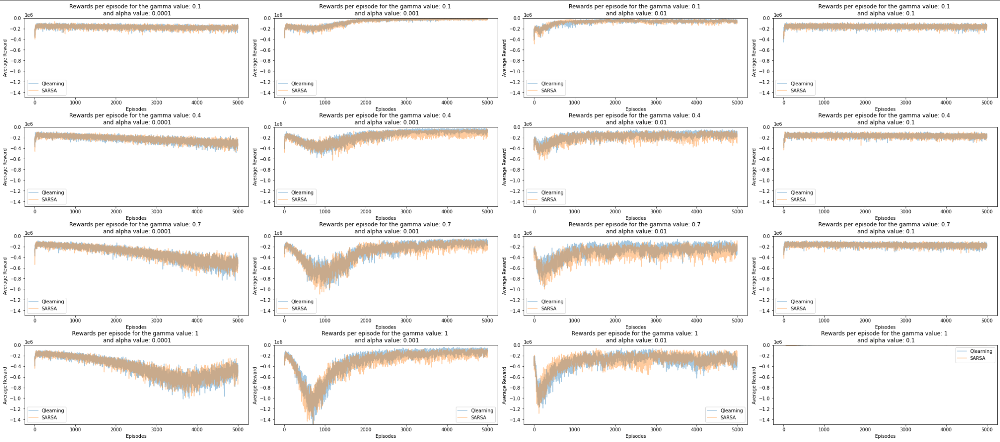

In [13]:
from IPython import display
display.Image("./Plots/Gamma_Alpha_testing.PNG")


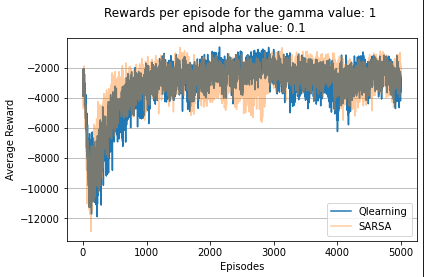

In [15]:
#The last image replotted to highlight the plot itself
display.Image("./Plots/16thTest_Gamma_Alpha.PNG")

# Adapted hyperparameter test run


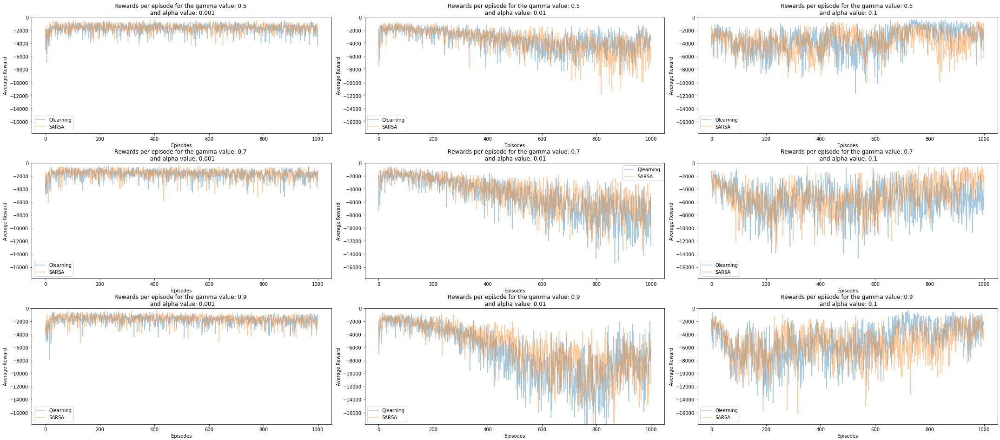

In [14]:
from IPython import display
display.Image("./Plots/Rewards_2000episodes_20runs.PNG")

# State Value Distribution of both Q learning and Sarsa

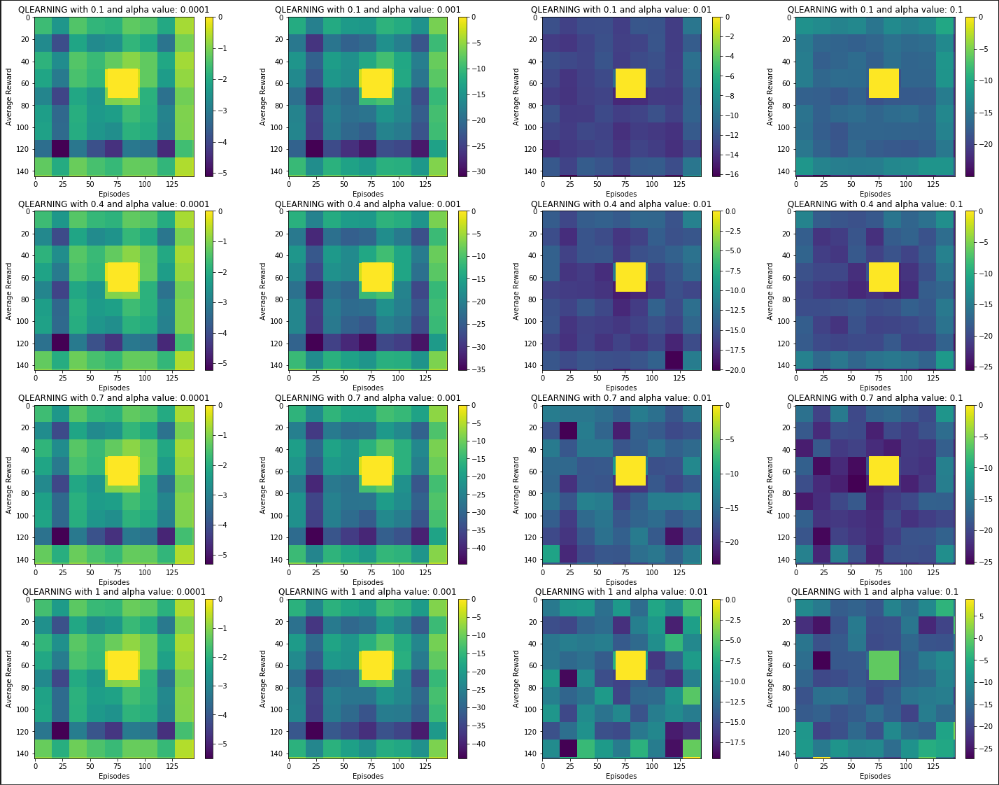

In [16]:
display.Image("./Plots/Qlearning_state_values.PNG")

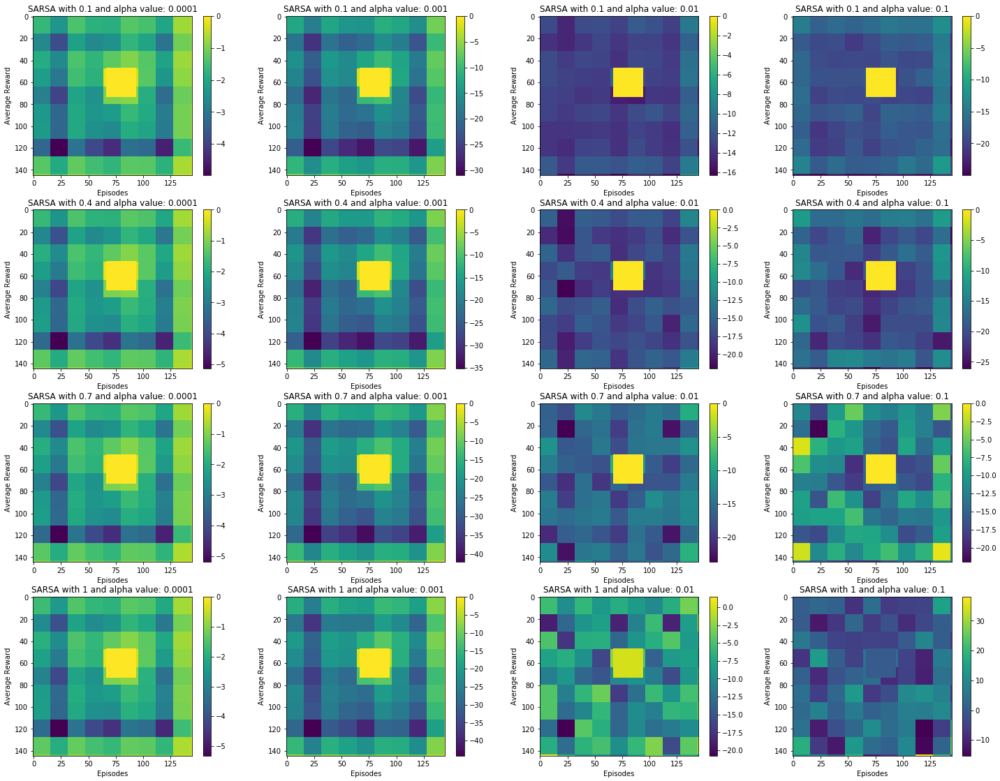

In [17]:
display.Image("./Plots/Sarsa_state_values.PNG")

## Testing the Agents 

We choose for a high gamma (value of 1) and a alpha of 0.1, as this showed the most promising results, depicted by the 15th subplot in the first plot. The second plot shows that this has a bit more variance, but we believe that this is caused by the low amount of episodes and runs used during the implementation process. Furthermore, as we used so little runs and episodes, the agent has less time to average out its steps, which can clearly be seen by the initial subplots. Furthermore, in the second subplot we see that using a very low gamma and low alpha results in barely any learning, and it would take an infinite number of runs and episodes to let that converge, which is computationally infeasible for us (and in general). Taking this into consideration, we will therefore made our decision for a higher alpha and a gamma of 1.   

In [27]:
alpha = 0.1; gamma = 1; epsilon = 0.1
num_runs = 20;  test_runs = 10

0
-1
0
-1
-2
-3
-4
-5
-6
-7
-8
-9
-10
-11
-12
-13
-14
-15
-16
-17
-18
-19
-20
-21
-22
-23
-24
-25
-26
-27
-28
-29
-30
-31
-32
-33
-34
-35
-36
-37
-38
-39
-40
-41
-42
-43
-44
-45
-46
-47
-48
-49
-50
-51
-52
-53
-54
-55
-56
-57
-58
-59
-60
-61
-62
-63
-64
-65
-66
-67
-68
-69
-70
-71
-72
-73
-74
-75
-76
-77
-78
-79
-80
-81
0
-1
-2
-3
-4
-5
-6
-7
-8
-9
-10
-11
-12
0
-1
-2
-3
-4
-5
0
-1
-2
-3
-4
-5
-6
-7
-8
-9
-10
-11
-60
-13
-14
-15
-16
-17
-18
-19
-20
-21
-22
-23
-24
-25
-26
-27
-28
-29
-30
-31
-32
-33
-34
-35
-180
-37
-190
-39
-40
-41
-42
-43
-44
-45
-46
-47
-48
-49
-250
-51
-52
-53
-54
-55
-56
-57
-58
-59
-60
0
-1
0
-1
-2
-3
0
-1
-2
0
-1
-2
-3
-4
-5
-6
0
The median total reward is: [-1.0, -3321.0, -78.0, -15.0, -2374.0, -1.0, -6.0, -3.0, -21.0, 0.0]
The median total reward is: -10.5
The average total reward is: -582.0


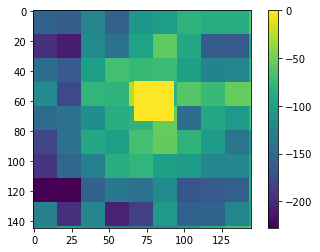

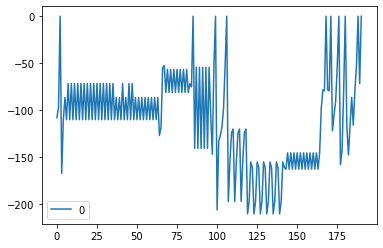

In [28]:
#Qlearning: Test phase
env_2 = Environment()
agent_007 = QAgent(alpha, gamma, epsilon)
agent_007.w = histGA_Qlearning[15][4]

num_tests = 1
reward_hist = []
for run in range(test_runs):
    start_state = env_2.reset()
    end_state, total_reward, animation_data = run_episode(env_2, agent_007, start_state, is_learning=False, is_rendering=True)
    reward_hist.append(total_reward)

print(f'The median total reward is: {reward_hist[:10]}')
reward_hist.sort()
print(f'The median total reward is: {statistics.median(reward_hist)}')
print(f'The average total reward is: {statistics.mean(reward_hist)}')

agent_007.plot_state_values()
agent_007.plot_q_values(skip=1)
render_epoch(animation_data, interval=100)

0
-1
-2
-3
-4
-5
-6
-7
-8
-9
-10
-11
-12
-13
-14
-15
-16
-17
-18
-19
-20
-105
-22
-23
-24
-25
-26
-27
-28
-29
-30
-31
-32
-33
-34
-35
-36
-37
-38
-39
-40
-205
-42
-43
-44
-225
-46
-47
-48
-49
-50
-51
-52
-53
-54
-55
-56
-57
-58
-59
-60
-61
-62
-63
-64
-65
-66
-335
-68
-345
-70
-71
-72
-73
-74
-75
-76
-77
-78
-395
-80
-405
-82
-83
-84
-85
-86
-87
-88
-89
-90
-91
-92
-93
-94
-95
-96
-97
-98
-99
-100
-101
-102
-103
-104
-105
-106
-107
-108
0
-1
-2
-3
-4
-5
-6
-7
-8
-9
-10
0
-1
-2
-3
-4
-5
-6
0
-1
-2
-3
-4
-5
-6
-7
-8
-9
-10
-11
-12
-13
-14
-15
-16
-17
-18
-19
-20
-21
-22
-23
-24
-25
-26
-27
-28
-29
-30
-31
-32
-33
-34
-35
-36
-37
-38
-39
-40
-41
-42
-43
-44
-45
-46
-47
-48
-49
-50
-51
-52
-53
0
-1
-2
-3
-4
-5
-6
-7
-8
-9
-10
-11
-12
-13
-14
-15
-16
-17
-18
-19
-20
-21
-22
-23
-24
-25
-26
-27
-140
-29
-30
-31
-160
-33
-170
-35
-36
-37
-38
-39
-40
-41
-42
-43
-44
-45
-230
-47
-240
-49
-50
-51
-260
-53
-270
-55
-280
-57
-290
-59
-300
-61
-62
-63
-64
-65
-66
-67
-340
-69
-70
-71
-360
-73
-74


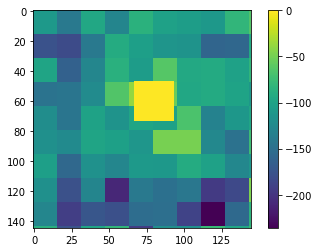

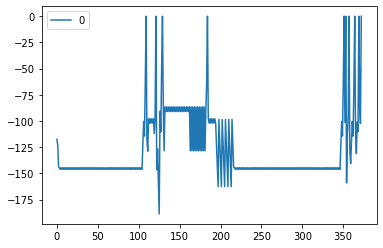

In [34]:
#SARSA: Test phase
#Qlearning: Test phase
env_2 = Environment()
SARSAAgent_test = SARSAAgent(alpha, gamma, epsilon)
SARSAAgent_test.w = histGA_Saarsa[15][4]

reward_hist = []
for run in range(test_runs):
    start_state = env_2.reset()
    end_state, total_reward, animation_data = run_episode(env_2, SARSAAgent_test, start_state, is_learning=False, is_rendering=True)
    reward_hist.append(total_reward)

print(f'The median total reward is: {reward_hist[:10]}')
reward_hist.sort()
print(f'The median total reward is: {statistics.median(reward_hist)}')
print(f'The average total reward is: {statistics.mean(reward_hist)}')

SARSAAgent_test.plot_state_values()
SARSAAgent_test.plot_q_values(skip=1)
render_epoch(animation_data, interval=100)

0
-1
-2
-3
-4
-5
-6
-7
-8
0
-1
0
-1
-2
-3
-4
-5
0
-1
-2
-3
-4
-5
-6
-7
-8
-9
-10
-55
-12
-13
-14
-75
-16
-85
-18
-95
-20
-21
-22
-115
-24
-25
-26
-135
-28
-29
-30
-31
-32
-165
-34
-35
-36
-185
-38
-39
-40
-41
-42
-43
-44
-45
-46
-47
-48
-49
-50
-51
-52
-53
-54
-55
-56
-285
-58
-59
-60
-305
-62
-63
-64
-65
-66
-67
-68
-345
-70
-71
-72
-73
-74
-75
-76
-77
-78
-79
-80
-81
-82
-83
-84
-85
-86
-435
-88
-89
-90
-91
-92
-93
-94
-95
-96
-97
-98
-99
-100
-101
-102
-103
-104
-105
0
-1
-2
0
-1
0
-1
-2
0
-5
-2
-3
-4
-5
-6
-7
-8
-9
-10
-11
-12
-13
-14
-15
-16
-17
-18
-19
-20
-21
-22
-23
-24
-25
-26
-27
-28
-29
-30
-31
-160
-33
-34
-35
-180
-37
-38
-39
-40
-41
-42
-43
-44
-45
-46
-47
-48
-49
-50
-51
-52
-53
-54
-55
-280
-57
-290
-59
-300
-61
-310
-63
-320
-65
-330
-67
-340
-69
-70
-71
-360
-73
-74
-75
-380
-77
-390
-79
-400
-81
-82
-83
-420
-85
-86
-87
-88
-89
-90
-91
-92
-93
-94
-95
-96
-97
-98
-99
-100
-101
-510
-103
-104
-105
-106
-107
-108
-109
-110
-111
-112
-113
-114
-115
-116
-117
-118
-119
-

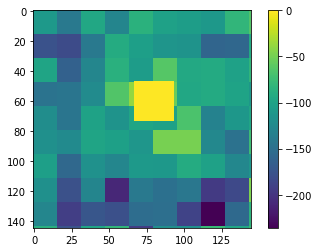

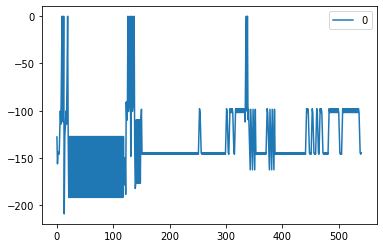

In [36]:
#RandomAgent: Test phase
env_2 = Environment()
Random_agent_test = RandomAgent(alpha, gamma, epsilon)
Random_agent_test.w = histGA_Saarsa[15][4]

num_tests = 1
reward_hist = []
for run in range(test_runs):
    start_state = env_2.reset()
    end_state, total_reward, animation_data = run_episode(env_2, Random_agent_test, start_state, is_learning=False, is_rendering=True)
    reward_hist.append(total_reward)

print(f'The median total reward is: {reward_hist[:10]}')
reward_hist.sort()
print(f'The median total reward is: {statistics.median(reward_hist)}')
print(f'The average total reward is: {statistics.mean(reward_hist)}')

Random_agent_test.plot_state_values()
Random_agent_test.plot_q_values(skip=1)
render_epoch(animation_data, interval=100)

# 3.2 Question

**3.2 Please interpret the results/plots (2 points)**. Explain how two algorithms differ in the learning procedure from another and what the results say about the parameters alpha (step-size) and gamma (decay-rate).

# 3.2 Answer

With respect to learning, Q-learning directly learns the optimal policy, whilst SARSA learns a near-optimal (or ε-optimal) policy whilst exploring (learning an optimal policy would require a decaying epsilon). This difference can be traced back to the difference in how the Q value is updated after each action:

* (1) SARSA uses the Q' following a ε-greedy policy exactly, as A' is drawn from it. More specifically Sarsa uses the behaviour policy (meaning, the policy used by the agent to generate experience in the environment, which is typically epsilon-greedy) to select an additional action A', and then uses Q(S', A') (discounted by gamma) as expected future returns in the computation of the update target. Since, SARSA computes the difference between Q(s,a) and the weighted sum of the average action value and the maximum - $Q(st+1,at+1) = ε·meanaQ(st+1,a) + (1-ε)·maxaQ(st+1,a)_{1}$ - , Sarsa will converge to a solution that is optimal under the assumption that we keep following the same policy that was used to generate the experience. This will often be a policy with some element of (rather "stupid") randomness, like epsilon-greedy, because otherwise we are unable to guarantee that we'll converge to anything at all.


* (2) In contrast, Q-learning uses the maximum Q’ over all possible actions for the next step. More specifically, Q-learning does not use the behaviour policy to select an additional action A'. Instead, it estimates the expected future returns in the update rule as maxA Q(S', A) - a greedy estimate of the future, though not necessarly following it ("suppose that I would start following the greedy policy from now on, what would my expected future returns be then?"). Since, Q-Learning computes the difference between Q(s,a) and the maximum action value - Q(st+1,at+1) = maxaQ(st+1,a) -, Q-Learning will converge to a solution that is optimal under the assumption that, after generating experience and training, we switch over to the greedy policy.

### How do SARSA and Q learning differ
This means that Sarsa and Q-learning converge to different solutions / "optimal" policies and with rates of convergence. Sarsa as an On-Policy method, will converge faster than the Off-Policy method Q-learning if a decaying epsilon strategy is implemented and every state has been visited infinetly often. Off-policy methods suffer more from a higher variance and often find it more difficult to converge. Therefore in the case of high variance (in particular due to a high discount factor) and a decaying epsilon strategy, Sarsa will converge sooner. However, on the contrary, Q-learning will ignore exploratory moves whilst Sarsa does not, which will let Q-learning converge faster. In this case, as the epsilon value is kept consistent, Q-learning converges faster here. This can also be seen in the test runs above, as Q learning gets to the terminal state more often and therefore has less instances that it runs out of time.

### How do alpha and gamam values affect their learning
A larger $\alpha$ would be expected to amplify the performance improvement rate, meaning to improves faster in its performance, however, will make large jumps and thereby over- and underestimate the true q* by too strong corrections of the TD error ($\delta$) towards the agents Q value estimates, hence its estimates will oscillates around the true q value function. However, with a smaller $\alpha$, the estimate of the Q value function will get closer and closer to the true Q value function, albeit at the costs of learning speed (smaller improvement steps in the beginning). 

The discount factor gamma relates to the focus of the agent towards future rewards. The lower the discount value, the narrower the focus of the agent, whilst the higher the discount value, the more the agent takes future rewards into account. So if the discount factor is set at a value of 0, then the agent only looks at immediate rewards, whilst if the discount value is set to 1, then each future reward (till infinity) is weighed as heavily as immediate rewards. Due to the agent taking future rewards more seriously, the variance will increase. Furthermore, if the agent only values immediate rewards, it could miss potentially more optimal paths and thus result in a less than optimal policy. Therefore a balance must be struck, where the agent values future rewards, but also weighs immediate rewards more. The effect of a high gamma can also be seen in the state value representations from the tests, where the goal state is highlighted and the farther the state is from the goal state the darker its color. Theoretically it would be best shown with a cone state, however, as we do not run this an infinite amount of runs and episodes, this would not happen for us. If gamma was very low, then more states would show higher values, as the agent would more often take the immediate reward, and thus more often go to the same state. However, as there is a path towards the goal state visible, it indicates that the discount factor is applied and future states are taken into consideration by the agent.

###### $_{1}$(with meanaQ being the expected return for chosing a random action A when transfering from S to S' an infite amount of times.)


# 3.3 Question
**3.3 Let think one step further by looking at the policies you have learned (1.5 points).** 

Please compare the performance of your learned optimal policies using another simulation. In this simulation, you shall have three agents (Qlearning_Agent, SARSA_agent and Random_agent), where all three agents always use their initial policy to behave and find the goal in the given map (make sure the agent does NOT learn anymore!). The initial policies of Qlearning_Agent and SARSA_agent are the optimal policies learned from the above experiments (based on the final estimated Q-values using Q-learning and SARSA algorithm respectively). The inital policy of Random_Agent will select 4 actions randomly. There is no need to submit your codes for this question.

Describe the performance of three agents by running each agent on the task and discuss the results (1.5 points). You can use the render function provided above (and other helper functions) observe the different behaviors of three agents. You could also use an appropriate plot to show the different performances. 

Some questions you shall think about and answer (in case there are no differences or no special things, just indicate what you observed):
- How does the learned Q-learning policy and SARSA policy perform differently? Does it show the difference between on-policy and off-policy methods?
- What kind of strategy did the two RL agents learn similarly? How do they differ from the random policy?
- For the RL-learned policies, do you still observe something that does not perform so well? Can you think about possible ways to improve/solve it?

# 3.3 Answer

### Off policy vs On policy



SARSA and Q-learning behave differently from eachother, as Sarsa uses one policy to choose its action and uses the same policy to learn and update the optimal policy (so called On-Policy). Q-learning differs from this strategy, by using one policy to learn and update the optimal policy, whilst using a seperate policy to choose its actions. These two policies are segmented in behavior and target policies.  (for a more in-depth explanation adressiong the differences between On- and Off-policy mehtods see the beginn of section 3.2).



### Does it show the difference between on-policy and off-policy methods?

Q-learning state value representation seems to have a more straight-forward (more greedy) approach to the middle, strongly disfavouring state values at the cornors. This is representation of the states is more closer to an ideal representation of the state values, where the most outer states (especially in the corners) whould be come less and less preferable). SARSA, state value representation, however, still has a stronger noisy pattern and a more patch-like representation (because SARSA always uses a $\epsilon$-greedy stragtegy (On-policy for updates), hence approaximating the ideal representation less well. Possibly this would can be improved by increasing the number of episodes during the training, combined with using a decaying $\epsilon$ instead of a fixed one. However, both agents strongly suffer from getting stuck in loops due to a bad action value (and state value) representation. For example if the above test instance are initiated several times almost half of the time the agent get a time-out because of beeing stuck in a unescable loop (where the A is the same as A'').



### What kind of strategy did the two RL agents learn similarly & How do they differ from the random policy

On the other side the random agent performs worse than the Q-learning and SARSA agent (when excluding the loop-cases), however, it has the advantage of not getting stuck in non-escapable loops, since he always choses a random action (s if the epsilon clause was triggered). Therefore, somethimes get better average rewards, if the other agents get stuck in infinite loops, but is otherwise outperformed by both Q-learning and Sarsa.



### From the RL learned policies, are there things that do not perform so well? Can we improve on it?

The major problem for the Q-learning and SARSA agentare non-escapable loops and non-optimal state action value representation (see also teh state value plots). Given the limitation in hardware metrics, we chose a high alpha in order to achieve good results in reasonable time, however, an possible improvement is to increase the number of episodes for a lower alpha, such that it converges to the optimal solution, though very slowly. In addition

more agents with random initialize starting positions averaged over their performance (>num_runs), might give a more robust representation of the environment. Other thoughts on improvement is to implement a decaying epsilon and decaying alpha strategy. By doing the first, the agents would put less emphasis on exploration and use their gained knowledge of the states to exploit the environment to get the best rewards. In the case of the latter, the agent will be initially quickly move towards the goal state, but as it gets closer it will lower the size of the jumps, thereby lowering the chance of overestimating the position of the goal state.

You are almost done! Before handing in, make sure that the codes you hand in work, and that all plots are shown. **Submit just one file per team.**

Again, make your you name this file according to your last names.